# 🐶 End-to-End Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. Problem

Identify the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.
https://www.kaggle.com/c/dog-breed-identification/overview

## 3. Evaluation

the evaluation is a file with predition probabilities for each dog breed of each test image

## 4. Features

Some information about the data:
* We're dealing with images(unstructed data) so it's probably best we use deep learning/transfer learning.

* There are 120 breeds of dogs (this means are 120 different classes)

* There are around 10,000+ images in training set(these image have labels)

* There are around 10,000+ images in testing set(These image don't have labels)


In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
# To unzip the data into google drive using colab
#!unzip "/content/drive/MyDrive/Machine_Learning_projects/Dog_breed_prediction_ZTM/dog-breed-identification.zip" -d "/content/drive/MyDrive/Machine_Learning_projects/Dog_breed_prediction_ZTM/"

### Get our Workspace Ready

* Import Tensorflow 2.x ✅
* Import TensorFlow Hub (from here we will select our model) ✅
* make sure we're using a GPU ✅

In [3]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("Tf version: ", tf.__version__)
print("TF hub version: ", hub.__version__)

# Check for GPU availability
print("GPU", "avilablel (YESSS)" if tf.config.list_physical_devices("GPU") else "Not available")

Tf version:  2.12.0
TF hub version:  0.13.0
GPU avilablel (YESSS)


### Getting our data ready (turning into Tensors)

with all machine learning models, our data has to be in numeical format. So that's what we'll be doing first.

Let's start by accessing our data and checking out the labels

In [4]:
# Checkout the blabels of data
import pandas as pd
label_csv = pd.read_csv("drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/labels.csv")
print(label_csv.describe())
print(label_csv.head())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [5]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [6]:
len(label_csv)

10222

In [7]:
label_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


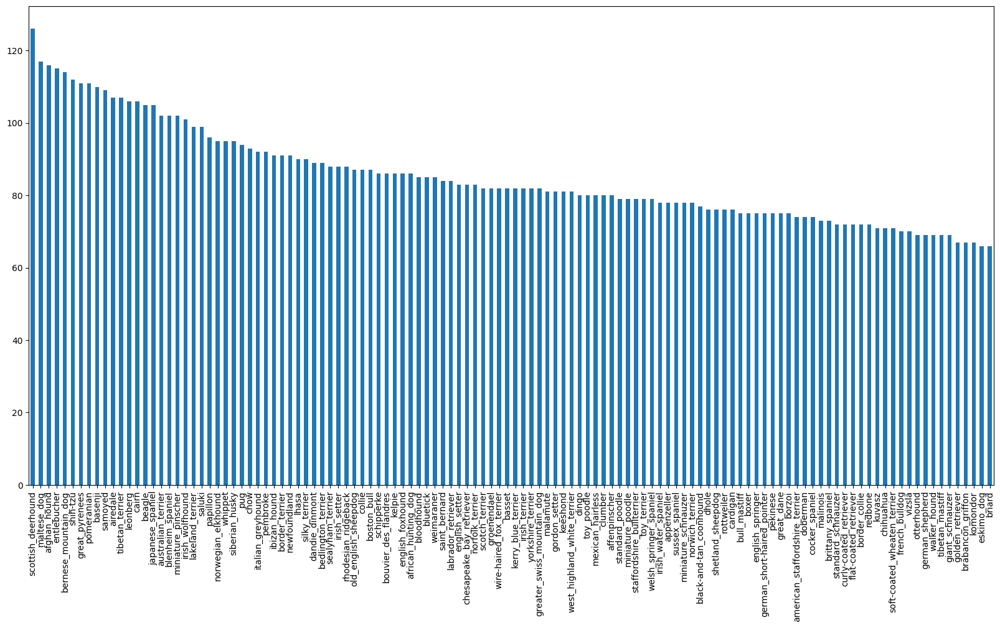

In [8]:
# How many images are there of each breed

label_csv.breed.value_counts().plot.bar(figsize=(20,10));

In [9]:
label_csv["breed"].value_counts().median()

82.0

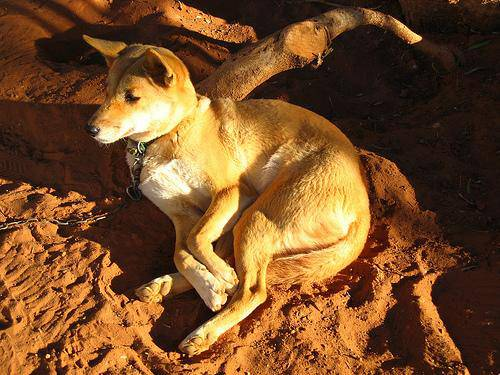

In [10]:
from IPython.display import Image
Image("drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [11]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [12]:
label_csv.isna().sum(), len(label_csv)

(id       0
 breed    0
 dtype: int64,
 10222)

In [13]:
# Create pathname for image ID's
filenames = ["drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/train/"+fname+".jpg" for fname in label_csv["id"]]

filenames[:10]

['drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/train/003df8b8a8b05244b1d920

In [14]:
import os
import numpy as  np
len(os.listdir("drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/train/"))

10251

In [15]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/train/")) == len(filenames):
  print("Filenames match acutal amount of files!! Proceed")
else:
  print("Filenames don't match acutal amount of files, check the target variable")
  #It will show not match but in my pc some of the files are duplicate so its ok for me

Filenames don't match acutal amount of files, check the target variable


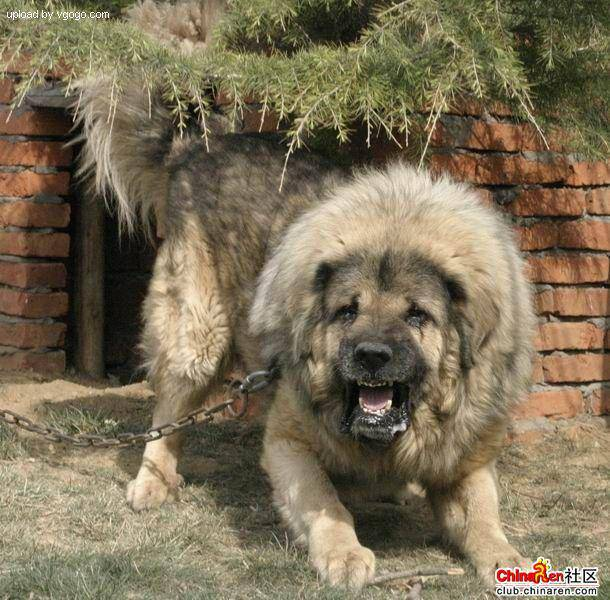

In [16]:
# One more check
Image(filenames[9000])

In [17]:
#One more check
label_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image files paths in a list, let's prepare our labels

In [18]:
labels = np.array(label_csv["breed"]) #or can use to_numpy() pandas methods does same thing as this
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [19]:
len(labels)

10222

In [20]:
# See if number of labels matches the number of filenames
if len(labels) == len(label_csv):
  print("number of matched")
else:
  print("Check previous code")

number of matched


In [21]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [22]:
len(unique_breeds)

120

In [23]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [24]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
len(boolean_labels)

10222

In [25]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [26]:
# Example: Turning boolean array into intergers
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [27]:
#Another way to convert labels to intergers
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
categorical_features = ["breed"]
encoder = OneHotEncoder()
transformer = ColumnTransformer([('encoder',encoder,categorical_features)])
transformed_df = transformer.fit_transform(label_csv)
pd.DataFrame(transformed_df.todense())

,0,1,2,3,4,5,6,7,8,9,...,110,111,112,113,114,115,116,117,118,119
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10217,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10218,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10219,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10220,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [28]:
len(filenames)

10222

In [29]:
# Setup X & y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [30]:
# Set nubmer of images to use for experimenting
NUM_IMAGES = 1000 #@param{type:"slider",min:1000,max:10000,step:1000}

In [31]:
from sklearn.model_selection import train_test_split

#Split them into training and validation of total sizes NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES], test_size=0.2, random_state=42)
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [32]:
X_train[:2],y_train[:2]

(['drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, 

## Preprocessing images (Turning images into tensors)
To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`

before we do let's see importing an image looks like



In [33]:
# convert an image to an numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [34]:
image.max(), image.min()

(255, 0)

In [35]:
tf.constant(image[:2]) #converting the image into an tensor and now its able to run into an gpu means lot faster processing


<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a fuction to preprocess them

* Take an image filepath as input
* Use TensorFlow to read the file and save it to a variable, image
* Turn our image (a jpg) into Tensors
* Normalize our image (convert the colour channel values from 0-255 to 0-1)
* Resize the image to be a shape of (224,224)
* Return the modified image

In [36]:
# Define Image size
IMG_SIZE = 224

def process_image(image_path,img_size = IMG_SIZE):
  """
  Takes an image file path and convert it into images
  """

  #Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colur channels (Red, Green, Yellow)
  image = tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channels values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size = [img_size,img_size])

  return image

## Turning our data into batches

Why convert our data into batches?
Let's say you're trying to process 10,000+ image in one go.. they all might not fit into memory

so That's why we do about 32(this is batch size) images at a time

In order to use Tensorflow effectively, we need our data in the form of Tensor tuples which look like this:

`(image,label)`

In [37]:
#yann lecun , jeremy haword some good figure
# Create a simple function to return a tuple of tensors(image ,label)

def get_image_label(image_path,label):
  image =process_image(image_path)
  # label = tf.constant(label)
  return image,label

In [38]:
process_image(X[42]), tf.constant(y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form `(image,label)`, let's make a function to turn all of our data (`X`, `y`) into batches

In [39]:
# Define the batch size, 32 is a good start

BATCH_SIZE = 32

#Create function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffle the data if It's training data but doesn't shuffle if it's validation data
  Also accept test data as input(no labels)
  """
  # If the data is a test data, we probably don't have label
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only file paths not labels
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                              tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch
  else:
    print("Creating training data batches....")
    # Turn file paths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))

    #Shuffling the pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    #Create (image,label) tuples also turn the image path into a preprocessed image
    data_batch = data.map(get_image_label).batch(batch_size)

    return data_batch

In [40]:
# Creating and training a validation databatchs
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches....
Creating validation data batches...


In [41]:
# Check out the different attribute of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, However, these can be a little hard to understand/cmprehend, let's visualize the data

In [42]:
import matplotlib.pyplot as plt

#Create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  #set the figure
  plt.figure(figsize=(10,10))
  #Loop through 25 for displaying 25 images
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')

In [43]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

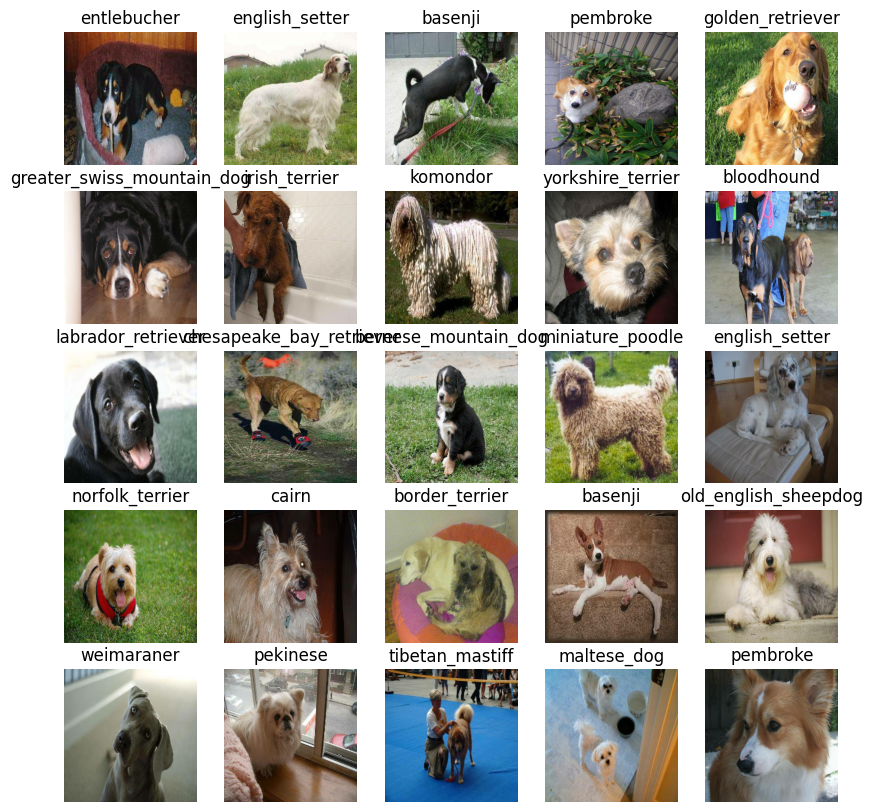

In [44]:
train_images, train_labels = next(train_data.as_numpy_iterator()) #since training data shuffle every time we call it
show_25_images(train_images,train_labels)

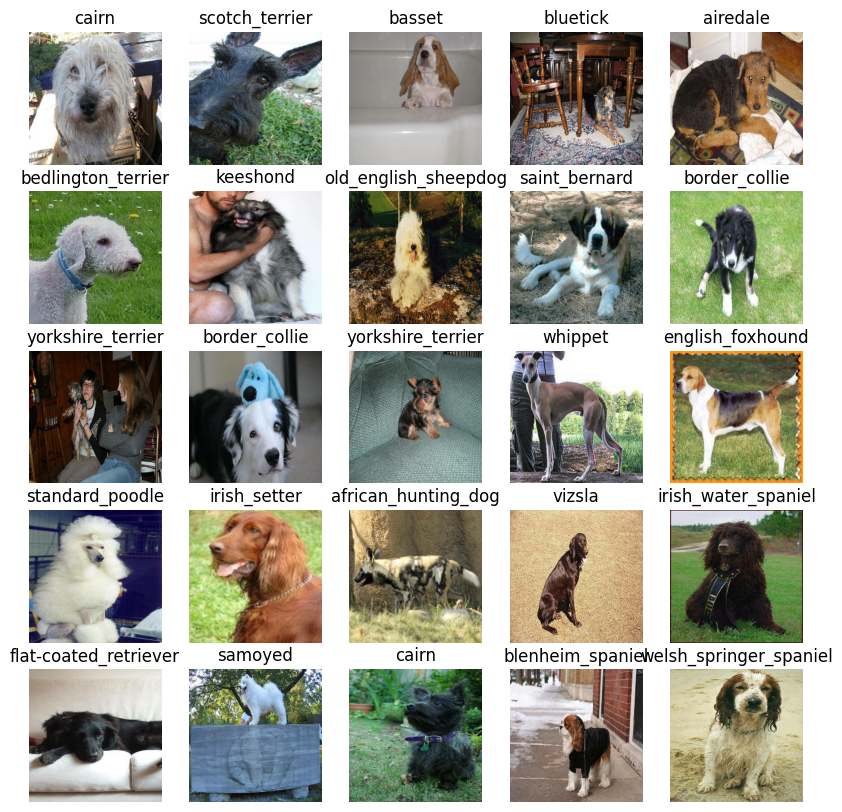

In [45]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of tensors) of our model
* the URL of the model we want to use

In [46]:
IMG_SIZE

224

## Tensorflow hub is a model reusable library, it is one of the most popular one but there are also some of other than that:
1. TensorFlow Hub
2. Pytorch HUB
3. Paper with Code
4. model zoo

mobilenet v5 https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [47]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # shape of our data batch input shape of the image

#setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# setupt model url from tensorflow hub
MODEL_URL ="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our input, outputs and model ready to go. let's put them together into a keras deep learning model!

Knowing this, let's creaet a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a keras model in sequential fashion (do this first , then this, than that)
* Compiles the model (says it should be evlautated and improved).
* Builds the model (tells the model the input shape it'll be getting)
* return to the model.


In [48]:
# create a function which builds a keras model
def Create_model(input_shape= INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with: ",model_url)

  # Setup the model layer
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url), # Layer 1 inputlayer
      tf.keras.layers.Dense(units=output_shape,
                            activation = "softmax") # Layer 2 (output layer)


  ])

  #Compile the model
  model.compile(loss= tf.keras.losses.CategoricalCrossentropy(),
                optimizer = tf.keras.optimizers.Adam(),
                metrics = ["accuracy"])

  # Build the model
  model.build(input_shape)

  return model

In [49]:
model = Create_model()
model.summary() #previously model is trained on imagenet database

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [50]:
outputs = np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating some callbacks
callbacks are helper functions a model can use during training to do such thing as saving the progres, check its' progress or stop training early if the model stops improving

we'll create two call backs:
1. One is tensorboard which helps track ours models progress
2. Early stopping call backs to stop model for training too long

### Tensorboard callback

To stepup a tensorboard callback , we need to do 3 things:
1. Load the Tensorboard noteboon extension
2. Create a Tensorboard callback which is able to save logs to a directory and pass it to our model's `fit()` function
3. Visualize our models training logs with %tensorboard magic function (we'll do this after model training)


### Early stopping callback
it prevents overfitting of the model

In [51]:
# Load Tensorboard notebook extension
%load_ext tensorboard

In [52]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  #Create a log directory for storing Tensorboard logs
  logdir = os.path.join('drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/logs', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [53]:
## Early stoping callbacks - if certain evaluation metric stops improving
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3) #see 3 epochs before stoping if it stops improving

## Training a model (a subset of data)

our first model is only goint to train on 1000 images, to make sure everything is working

In [54]:
NUM_EPOCHS = 100 #@param{type:"slider",min:10,max:100,step:10}

In [55]:
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [56]:
# Let's create a function tha tarins a model

def train_model():
  """
  Trains a give model and returns the trained version
  """
  #Craete a model
  model = Create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # fit the model to the data passing it the callbacks we craeted
  model.fit(x=train_data,
            epochs= NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])

  return model

In [57]:
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 116s 3s/step - loss: 4.6066 - accuracy: 0.0962 - val_loss: 3.2492 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 4s 149ms/step - loss: 1.6266 - accuracy: 0.7000 - val_loss: 2.0519 - val_accuracy: 0.5500
Epoch 3/100
25/25 [==============================] - 4s 148ms/step - loss: 0.5551 - accuracy: 0.9375 - val_loss: 1.6137 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 3s 121ms/step - loss: 0.2450 - accuracy: 0.9900 - val_loss: 1.4345 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 4s 173ms/step - loss: 0.1423 - accuracy: 0.9975 - val_loss: 1.3679 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 3s 120ms/step - loss: 0.0997 - accuracy: 0.9987 - val_loss: 1.3198 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================

### Checking the tensorbaord logs

The tensorboard magic function (`%tensorboard`) will acces the logs directory we created earlier and visualize tis content

In [58]:
%tensorboard --logdir drive/My\ Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluation prediction using a trained model

In [59]:
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 1s 89ms/step


array([[3.55779333e-03, 3.79042380e-04, 1.70834406e-04, ...,
        1.11417565e-03, 7.72852654e-05, 3.86707648e-03],
       [2.55258242e-03, 3.98225675e-04, 9.51854326e-03, ...,
        1.76288921e-03, 2.46329204e-04, 3.53774521e-04],
       [1.40241273e-05, 5.98047278e-04, 7.52778715e-06, ...,
        1.78526127e-04, 3.34963115e-05, 2.52584927e-04],
       ...,
       [1.25316565e-05, 4.34384652e-04, 2.50978774e-04, ...,
        2.49489767e-05, 1.62532684e-04, 1.31329332e-04],
       [1.16283074e-03, 6.64788822e-05, 3.90121422e-05, ...,
        3.35315970e-04, 4.26941479e-05, 1.04094502e-02],
       [3.93973518e-04, 1.51481727e-04, 1.54390710e-03, ...,
        8.34682304e-03, 2.27556680e-03, 9.39907477e-05]], dtype=float32)

In [60]:
predictions.shape

(200, 120)

In [61]:
len(y_val)

200

In [62]:
len(unique_breeds)

120

In [63]:
len(predictions[0])

120

In [64]:
np.sum(predictions[0])

0.99999994

In [65]:
# First prediction
index = 42
#confidence predictions - prediction probability
print(predictions[index])
print(f'Max value (probablity of prediction): {np.max(predictions[index])}')
print(f"Sum: {np.sum(predictions[index])}" )
print(f'max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[6.8626867e-04 7.1391689e-05 1.7683484e-04 1.1551438e-04 8.3978493e-03
 3.0755706e-04 7.7359303e-04 4.1614254e-03 8.3230138e-03 1.2771980e-01
 3.1420117e-05 6.2500192e-05 2.3596628e-04 1.8087024e-02 3.8790989e-03
 6.3483641e-03 6.3404797e-05 2.7456114e-04 1.4389261e-04 2.6387218e-04
 1.4693128e-04 4.1021165e-03 1.7191579e-04 3.8386712e-05 2.4112793e-02
 6.1437335e-05 7.5706557e-05 1.0692553e-03 7.8141934e-04 3.6630987e-05
 2.2143708e-04 2.0671565e-04 4.3385320e-05 7.4063275e-05 1.7253320e-04
 2.6203241e-04 8.4438251e-04 1.2561923e-03 9.2664390e-04 1.8042283e-01
 5.2840257e-04 4.7380563e-05 1.4428706e-02 2.6396039e-05 3.3197951e-04
 7.1313560e-05 3.6732332e-04 4.7542382e-04 8.9570857e-04 4.9330661e-04
 2.2448810e-04 3.6304854e-04 1.0296730e-03 3.3489023e-03 9.2549606e-05
 2.2235985e-03 5.3886627e-04 4.8654918e-05 1.9721907e-04 7.0064547e-05
 9.5308140e-05 2.5606728e-03 2.6932830e-05 3.7278683e-04 1.8195610e-04
 2.7272914e-04 7.5680357e-05 4.4027713e-04 1.0913053e-03 8.7383705e-05
 1.018

In [66]:
unique_breeds[113]

'walker_hound'

In [67]:
# Turn predition probability into their respective label (easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of predition probabilities into a lable
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[25])
pred_label

'irish_wolfhound'

In [68]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [69]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0].shape, val_labels[0]

((224, 224, 3), 'cairn')

Now we've got ways to get :
* prediction labels
* prediction labels(truth labels)
* validation images

Let's make function to make these all a bit more

we'll create a function which takes an array or prediction probabilities, an array of truth label and a array or images and integers


In [70]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  #plot iamge & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color
  if pred_label == true_label:
    color="green"
  else:
    color='red'

  # change the title to be predited, probality of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                              np.max(pred_prob)*100,
                              true_label), color = color)

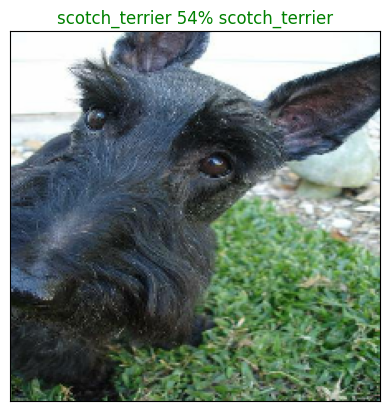

In [71]:
plot_pred(predictions, val_labels, val_images)

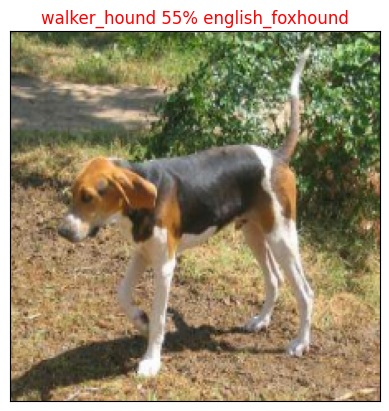

In [72]:
plot_pred(predictions, val_labels, val_images, n=42)

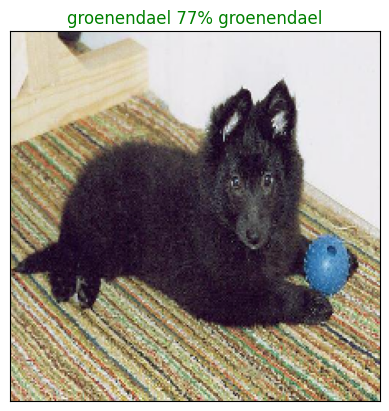

In [73]:
plot_pred(predictions, val_labels, val_images, n=77)

Now we've got one function to visualize our model prediction, let's make another to view our models top predictions

this function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* find the prediction using  `get_pred_label()`
* Find the top 10:
  * prediction probabilities indexes
  * prediction probabilities valies
  * prediction labels
* plto the top 10 prediction probability values and labels, coloring the true label green

In [74]:
def plot_pred_conf(prediction_prob, labels, n=1):
  """
  Plus the top 10 highest predictions confidences along with truth labels for sample n
  """
  pred_prob, true_label = prediction_prob[n], labels[n]

  pred_label = get_pred_label(pred_prob)

  # find the top 10 predictions confidence index
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  top_10_pred_value = pred_prob[top_10_pred_indexes]

  # find the top ten prediction label
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_value,
                     color='grey')

  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels,rotation='vertical')

  #change the color or true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

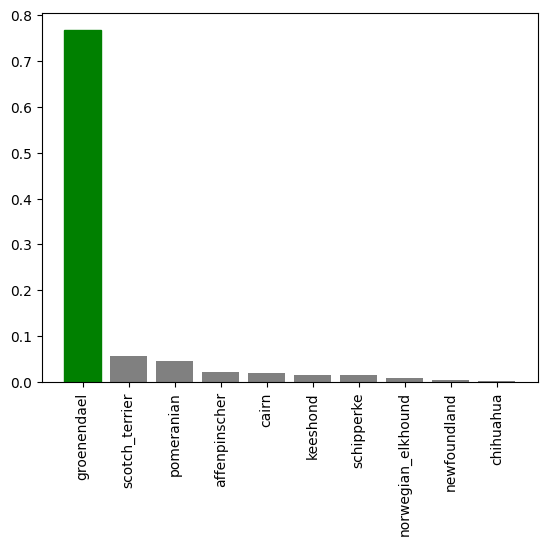

In [75]:
plot_pred_conf(predictions, val_labels, n=77)

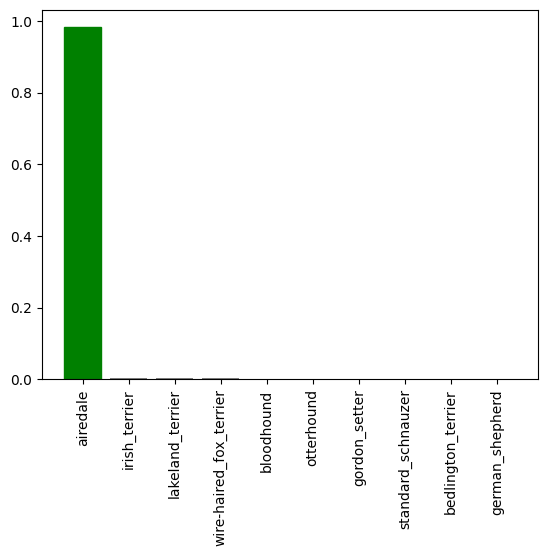

In [76]:
plot_pred_conf(predictions, val_labels, n=4)

Now we've got some function to help us visualize our predictions and evaluate our model let's checkout a few

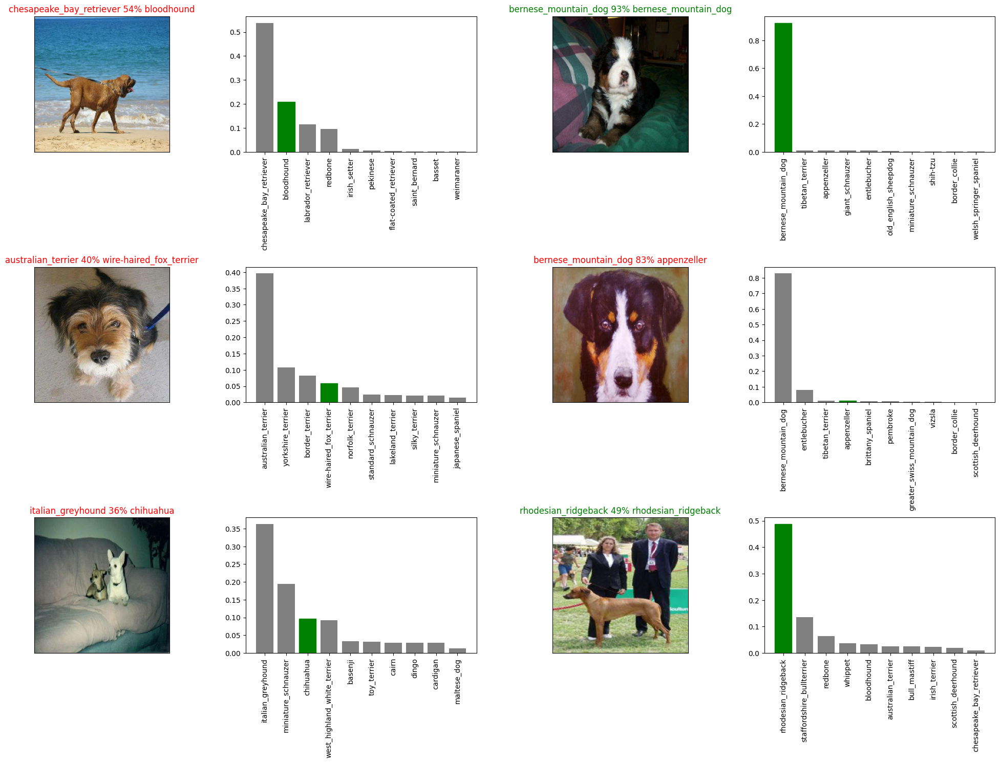

In [77]:
# Let's check our a few prediction and their different values
i_multiplier = 100
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols

plt.figure(figsize= (10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2* num_cols, 2*i+1)
  plot_pred(predictions,
            val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions,
            val_labels,
            n=i+i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

## Save our trained model and loading

In [78]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """

  # Create a model directory path name with current time
  modeldir = os.path.join("drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}....")

  model.save(model_path)
  return model_path

In [79]:
# Create a function to load a model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from : {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer}) # since we are using model form tensroflow hub
  return model

Let's see does this functions work

In [80]:
# Save our mode trained on 1000 images
saved_path = save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/models/20230618-162749-1000-images-mobilenetv2-Adam.h5....


In [81]:
#Load a trained model
loaded_1000_images_model = load_model(saved_path)


Loading saved model from : drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/models/20230618-162749-1000-images-mobilenetv2-Adam.h5


In [82]:
# Evaluate the presaved model
model.evaluate(val_data)

7/7 [==============================] - 1s 78ms/step - loss: 1.2612 - accuracy: 0.6550


[1.2612472772598267, 0.6549999713897705]

In [83]:
#Evaluate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 90ms/step - loss: 1.2612 - accuracy: 0.6550


[1.2612472772598267, 0.6549999713897705]

In [84]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

## Training a big Dog model (on the full data)

In [85]:
len(X), len(y)

(10222, 10222)

In [87]:
len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [88]:
# Create a databatch with full dataset
full_data = create_data_batches(X,y)

Creating training data batches....


In [89]:
full_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [90]:
# Create a model for full model
full_model = Create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [93]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                    patience = 3)

**Note:** - Running the cell below will take a little while (maybe up to 30 min for the first epochs) because the GPU we're using in the runtime has to load all of the images into memory

In [95]:
# Fit the full model to full data

full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 44s 111ms/step - loss: 1.3427 - accuracy: 0.6671
Epoch 2/100
320/320 [==============================] - 33s 104ms/step - loss: 0.3990 - accuracy: 0.8804
Epoch 3/100
320/320 [==============================] - 49s 154ms/step - loss: 0.2345 - accuracy: 0.9353
Epoch 4/100
320/320 [==============================] - 34s 105ms/step - loss: 0.1525 - accuracy: 0.9637
Epoch 5/100
320/320 [==============================] - 35s 111ms/step - loss: 0.1065 - accuracy: 0.9784
Epoch 6/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0770 - accuracy: 0.9854
Epoch 7/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0591 - accuracy: 0.9925
Epoch 8/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0451 - accuracy: 0.9948
Epoch 9/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0366 - accuracy: 0.9967
Epoch 10/100
320/320 [==============================] - 34s 108m

In [96]:
save_model(full_model,suffix = "full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/models/20230618-165116-full-image-set-mobilenetv2-Adam.h5....


'drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/models/20230618-165116-full-image-set-mobilenetv2-Adam.h5'

In [97]:
#load in full model
loaded_full_model = load_model("drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/models/20230618-165116-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from : drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/models/20230618-165116-full-image-set-mobilenetv2-Adam.h5


In [98]:
len(os.listdir("drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/test"))

10367

## Making predictions on the test dataset

In [104]:
# Load test image file names
test_path = "drive/MyDrive/Machine_Learning_projects/Dog_breed_prediction_ZTM/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Machine_Learning_projects/Dog_breed_prediction_ZTM/test/df2a003a0b1a216effd806f03f703859.jpg',
 'drive/MyDrive/Machine_Learning_projects/Dog_breed_prediction_ZTM/test/dce8d03553ab29570f67a28bf0ee0709.jpg',
 'drive/MyDrive/Machine_Learning_projects/Dog_breed_prediction_ZTM/test/e520e4cd7608c47cd9017bb87e88f334.jpg',
 'drive/MyDrive/Machine_Learning_projects/Dog_breed_prediction_ZTM/test/e24b98741c9c780d7c5203def153f00c.jpg',
 'drive/MyDrive/Machine_Learning_projects/Dog_breed_prediction_ZTM/test/e715a411098c046cac90c3facfa58c77.jpg',
 'drive/MyDrive/Machine_Learning_projects/Dog_breed_prediction_ZTM/test/e3a43510b5f90bfb9fb050c77cabb079.jpg',
 'drive/MyDrive/Machine_Learning_projects/Dog_breed_prediction_ZTM/test/df47feaaf3dfb33cf712cccdddc8060e.jpg',
 'drive/MyDrive/Machine_Learning_projects/Dog_breed_prediction_ZTM/test/e26d745f820e6b14cae26bb5def0648f.jpg',
 'drive/MyDrive/Machine_Learning_projects/Dog_breed_prediction_ZTM/test/e05367db91d0449b2afe76a1b7acc1c8.jpg',
 

In [105]:
len(test_filenames)

10367

In [106]:
# Create test data batch
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [107]:
test_data.element_spec

TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)

**Note** calling predict on our full model and passing it the test data batch will take a long time to run (about an ~1hr)

In [108]:
# make prediction on test_data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 168s 511ms/step


In [109]:
#Save prediction (Numpy array) to csv file (for access later)
np.savetxt("drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/preds_array.csv",test_predictions,delimiter = ",")

In [111]:
test_predictions = np.loadtxt("drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/preds_array.csv", delimiter = ',')

In [114]:
get_pred_label(test_predictions[0])

'gordon_setter'

In [115]:
test_predictions.shape

(10367, 120)

## submitting data to Kaggle
#### Preparing test dataset predictions for submission - According to kaggle requirements

In [116]:
# Create a pandas dataFrame with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [119]:
# Append test image id's to prediction dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [121]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df2a003a0b1a216effd806f03f703859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dce8d03553ab29570f67a28bf0ee0709,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e520e4cd7608c47cd9017bb87e88f334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e24b98741c9c780d7c5203def153f00c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e715a411098c046cac90c3facfa58c77,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [122]:
# Add the prediction probabilities to each dog breed columns
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df2a003a0b1a216effd806f03f703859,2.426971e-10,4.998320e-05,1.633765e-09,4.860934e-07,4.098532e-11,1.774367e-05,5.378385e-10,1.979580e-09,1.684559e-07,...,2.152974e-08,1.307849e-12,2.782896e-07,1.062646e-07,4.736477e-07,8.084025e-09,1.915871e-08,6.746477e-08,4.502644e-11,1.375681e-10
1,dce8d03553ab29570f67a28bf0ee0709,2.599361e-08,1.255615e-11,2.863703e-11,2.137808e-09,2.151038e-07,5.900013e-08,1.094495e-06,2.354500e-05,3.238262e-10,...,1.094977e-07,1.461373e-07,5.246736e-09,5.194054e-09,2.566909e-11,2.456308e-08,6.466567e-10,5.902697e-10,2.141057e-08,4.378755e-10
2,e520e4cd7608c47cd9017bb87e88f334,4.737337e-01,7.438442e-10,1.355841e-09,2.865001e-12,2.729899e-09,2.168852e-09,2.392277e-12,1.797945e-10,2.490311e-11,...,1.888700e-04,3.769023e-06,2.138193e-10,1.319152e-08,1.197355e-08,1.256198e-10,6.818216e-08,1.042681e-10,1.978885e-08,1.051023e-06
3,e24b98741c9c780d7c5203def153f00c,2.042884e-10,1.203992e-09,1.779916e-10,2.485637e-11,1.161456e-11,1.602292e-10,2.345760e-06,1.664694e-10,6.179549e-09,...,1.160019e-08,1.285701e-10,1.218002e-10,3.820087e-12,1.744052e-10,1.250126e-11,4.097917e-09,1.530358e-11,8.175914e-09,3.125723e-09
4,e715a411098c046cac90c3facfa58c77,9.079546e-09,3.634576e-10,4.229529e-10,6.169074e-11,3.483754e-08,4.361949e-10,8.801784e-07,6.377198e-11,2.355877e-08,...,4.603930e-10,2.055768e-10,5.947982e-10,6.608701e-10,1.476869e-10,4.695364e-09,1.007259e-06,1.607543e-08,4.775267e-05,2.206065e-09


In [123]:
preds_df.to_csv("drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/full_model_predictions_submission_1_mobilenetV2.csv",index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepahts of our own images
* Turn the filepaths int data batches using `create_data_batches()` and since our custom images won't have labels, we set the `test_data` parameters to True

In [133]:
custom_path = "drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/custom-data/"
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]

In [134]:
custom_image_path

['drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/custom-data/image1.jpg',
 'drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/custom-data/image2.jpg',
 'drive/My Drive/Machine_Learning_projects/Dog_breed_prediction_ZTM/custom-data/image3.jpg']

In [135]:
custom_data = create_data_batches(custom_image_path,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [136]:
# making predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 980ms/step


In [137]:
custom_preds.shape

(3, 120)

In [138]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'golden_retriever', 'pug']

In [139]:
# Get custom images (our unbatchify() function won't work since tehre aren't labels.. maybe we could fix this later )
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

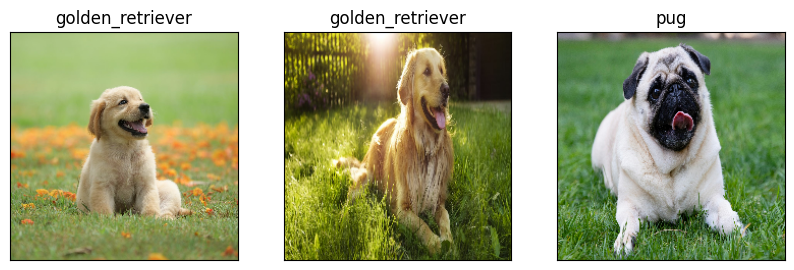

In [140]:
# Check custom predictions
plt.figure(figsize = (10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

https://www.tensorflow.org/resources/learn-ml